# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [1]:
import warnings
import matplotlib.cbook
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

In [7]:
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

## 1.1 Reading Data

In [8]:
project_data = pd.read_csv('train_data.csv')
print(project_data.shape)
resource_data = pd.read_csv('resources.csv')

(109248, 17)


In [9]:
# to detect the "NaN in numeric arrays, None or NaN in object arrays, NaT in datetimelike" in dataframe 
# and counting their number in each columns
# https://pandas.pydata.org/pandas-docs/version/0.23.4/generated/pandas.isnull.html
# https://stackoverflow.com/a/26266451
project_data.isnull().sum()

Unnamed: 0                                           0
id                                                   0
teacher_id                                           0
teacher_prefix                                       3
school_state                                         0
project_submitted_datetime                           0
project_grade_category                               0
project_subject_categories                           0
project_subject_subcategories                        0
project_title                                        0
project_essay_1                                      0
project_essay_2                                      0
project_essay_3                                 105490
project_essay_4                                 105490
project_resource_summary                             0
teacher_number_of_previously_posted_projects         0
project_is_approved                                  0
dtype: int64

**So I'll drop only thows rows which 'NaN' which correspond to 'teacher_prefix', not the 'project_essay_3' and ''project_essay_4' columns**

In [10]:
project_data.dropna(axis = 0, how = 'any', subset = ['teacher_prefix'], inplace = True)
print(project_data.shape)
project_data.head(1)

(109245, 17)


,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Literacy & Language,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0


In [11]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109245, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [12]:
# how to replace elements in list python: https://stackoverflow.com/a/2582163/4084039
cols = ['Date' if x=='project_submitted_datetime' else x for x in list(project_data.columns)]


#sort dataframe based on time pandas python: https://stackoverflow.com/a/49702492/4084039
project_data['Date'] = pd.to_datetime(project_data['project_submitted_datetime'])
project_data.drop('project_submitted_datetime', axis=1, inplace=True)
project_data.sort_values(by=['Date'], inplace=True)


# how to reorder columns pandas python: https://stackoverflow.com/a/13148611/4084039
project_data = project_data[cols]


project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Math & Science,"Applied Sciences, Health & Life Science",Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1
76127,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Special Needs,Special Needs,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1


In [13]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


In [0]:
# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
price_data.head(2)

# join two dataframes in python: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.merge.html#pandas-dataframe-merge
project_data = pd.merge(project_data, price_data, on='id', how='left')


In [15]:
print(project_data.shape)
project_data.head(1)

(109245, 19)


,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,price,quantity
0,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Math & Science,"Applied Sciences, Health & Life Science",Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1,725.05,4


## 1.2 preprocessing of `project_subject_categories`

In [0]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" "   #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

## 1.3 preprocessing of `project_subject_subcategories`

In [0]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

## 1.4 Text preprocessing

In [18]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,price,quantity,clean_categories,clean_subcategories,essay
0,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1,725.05,4,Math_Science,AppliedSciences Health_LifeScience,I have been fortunate enough to use the Fairy ...
1,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1,213.03,8,SpecialNeeds,SpecialNeeds,Imagine being 8-9 years old. You're in your th...


In [19]:
# printing some random reviews
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)
print(project_data['essay'].values[1000])
print("="*50)
print(project_data['essay'].values[10000])
print("="*50)
print(project_data['essay'].values[99999])
print("="*50)

I have been fortunate enough to use the Fairy Tale STEM kits in my classroom as well as the STEM journals, which my students really enjoyed.  I would love to implement more of the Lakeshore STEM kits in my classroom for the next school year as they provide excellent and engaging STEM lessons.My students come from a variety of backgrounds, including language and socioeconomic status.  Many of them don't have a lot of experience in science and engineering and these kits give me the materials to provide these exciting opportunities for my students.Each month I try to do several science or STEM/STEAM projects.  I would use the kits and robot to help guide my science instruction in engaging and meaningful ways.  I can adapt the kits to my current language arts pacing guide where we already teach some of the material in the kits like tall tales (Paul Bunyan) or Johnny Appleseed.  The following units will be taught in the next school year where I will implement these kits: magnets, motion, si

In [0]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [21]:
sent = decontracted(project_data['essay'].values[20000])
print(sent)
print("="*50)

Some of my students come from difficult family lives, but they do not let that stop them. We have built a community in our classroom that allows each student to be comfortable with who they are. Even though we are a diverse school, everyone feels included. We have a high Hispanic population, and about 90% of the students are on free or reduced-price lunch. Most students are living with a single parent or both parents work full time, although many parents are eager to help in any way they can.\r\nWe all know how important it is to get kids up and moving. I want my classroom to be a place where students can be active phyically and mentally. The requested items will allow my students to move all day. When they are sitting in a chair, their movement is limited.\r\n       Kindergarten students have a hard time sitting still for long periods of time. They would much rather bounce on a stability ball or wiggle on a cushion than sit in a hard chair. Having these choices in my classroom will al

In [22]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

Some of my students come from difficult family lives, but they do not let that stop them. We have built a community in our classroom that allows each student to be comfortable with who they are. Even though we are a diverse school, everyone feels included. We have a high Hispanic population, and about 90% of the students are on free or reduced-price lunch. Most students are living with a single parent or both parents work full time, although many parents are eager to help in any way they can.  We all know how important it is to get kids up and moving. I want my classroom to be a place where students can be active phyically and mentally. The requested items will allow my students to move all day. When they are sitting in a chair, their movement is limited.         Kindergarten students have a hard time sitting still for long periods of time. They would much rather bounce on a stability ball or wiggle on a cushion than sit in a hard chair. Having these choices in my classroom will allow 

In [23]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

Some of my students come from difficult family lives but they do not let that stop them We have built a community in our classroom that allows each student to be comfortable with who they are Even though we are a diverse school everyone feels included We have a high Hispanic population and about 90 of the students are on free or reduced price lunch Most students are living with a single parent or both parents work full time although many parents are eager to help in any way they can We all know how important it is to get kids up and moving I want my classroom to be a place where students can be active phyically and mentally The requested items will allow my students to move all day When they are sitting in a chair their movement is limited Kindergarten students have a hard time sitting still for long periods of time They would much rather bounce on a stability ball or wiggle on a cushion than sit in a hard chair Having these choices in my classroom will allow students to be active and 

In [0]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

__essay preprocessing__

In [25]:
# Combining all the above stundents 
from tqdm import tqdm
essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    essays.append(sent.lower().strip())

100%|██████████| 109245/109245 [00:55<00:00, 1958.51it/s]


__Project_title preprocessing__

In [26]:
# similarly you can preprocess the titles also
# Combining all the above stundents 
from tqdm import tqdm
titles = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    titles.append(sent.lower().strip())

100%|██████████| 109245/109245 [00:02<00:00, 42837.82it/s]


In [27]:
# replace the essay and title by prprocessed essay and title
project_data['essay'] = essays
project_data['project_title'] = titles

# to select required columns: https://stackoverflow.com/a/11287278
project_data = project_data[['school_state','clean_categories', 'clean_subcategories','project_grade_category','teacher_prefix',
                             'project_title', 'essay', 'project_resource_summary',
                             'quantity', 'teacher_number_of_previously_posted_projects','price',
                             'project_is_approved']]
print(project_data.shape)
project_data.head(1)

(109245, 12)


,school_state,clean_categories,clean_subcategories,project_grade_category,teacher_prefix,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,project_is_approved
0,CA,Math_Science,AppliedSciences Health_LifeScience,Grades PreK-2,Mrs.,engineering steam primary classroom,fortunate enough use fairy tale stem kits clas...,My students need STEM kits to learn critical s...,4,53,725.05,1


In [28]:
# taking all required features into one variable as X and assinging target value to Y
X = project_data[['school_state','clean_categories', 'clean_subcategories','project_grade_category','teacher_prefix',
                  'project_title', 'essay', 'project_resource_summary',
                  'quantity', 'teacher_number_of_previously_posted_projects','price']].copy()
Y = project_data[['project_is_approved']]

a = Y['project_is_approved'].value_counts()
cl_weight = {0: round(a[1]/(a[0]+a[1]),2), 1: round(a[0]/(a[0]+a[1]), 2)}
print(cl_weight)

{0: 0.85, 1: 0.15}


## 1.5 Preparing data for models

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

### 1.5.1 Vectorizing Categorical data (Response Coding)

#### 1.5.1.3 For 'state'

In [29]:
#taking unique value in a column of pandas dataframe: https://stackoverflow.com/a/26977495
states = pd.unique(project_data['school_state'].values)

# to create dictionary with keys: https://stackoverflow.com/a/2244026
state_dict = {key: [0,0] for key in states} #first value correspond to class '0' and second value correspond to class '1'
print('='*50,'\n',state_dict.keys())

# updating the number of class '0' and '1' in each iteration
for i, state in tqdm(enumerate(project_data['school_state'].values)):
  if project_data['project_is_approved'].iloc[i] == 0:
    state_dict[state][0] += 1
  else:
    state_dict[state][1] += 1
    
# changing into probabilities of class: P(state/y=class)
for key in state_dict.keys():
  a = np.sum(state_dict[key])
  state_dict[key][0] = np.round(state_dict[key][0]/a, 4)
  state_dict[key][1] = np.round(state_dict[key][1]/a, 4)
   

# updating the school_state columns of project_data
state_0_1 = []
for state in tqdm(project_data['school_state'].values):
  state_0_1.append(state_dict[state])
  
# print('='*50,'\nLength of state_0_1 is: ',len(state_0_1))
project_data['school_state'] = state_0_1

# splitting columns containg list
project_data[['state_0', 'state_1']] = pd.DataFrame(project_data['school_state'].values.tolist(), index = project_data.index)
#Now droping the any one of the columns 'state_0' and 'state_1' beacsue

# dropping the school_state columns
project_data.drop('school_state', axis = 1, inplace = True)
project_data.head(2)

0it [00:00, ?it/s]

 dict_keys(['CA', 'UT', 'GA', 'WA', 'HI', 'IL', 'OH', 'KY', 'SC', 'FL', 'MO', 'MI', 'NY', 'VA', 'MD', 'TX', 'MS', 'NJ', 'AZ', 'OK', 'PA', 'WV', 'NC', 'CO', 'DC', 'MA', 'ID', 'AL', 'ME', 'TN', 'IN', 'LA', 'CT', 'AR', 'KS', 'OR', 'WI', 'IA', 'SD', 'AK', 'MN', 'NM', 'NV', 'MT', 'RI', 'NH', 'WY', 'NE', 'DE', 'ND', 'VT'])


109245it [00:01, 63987.98it/s]
100%|██████████| 109245/109245 [00:00<00:00, 1911448.67it/s]


,clean_categories,clean_subcategories,project_grade_category,teacher_prefix,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,project_is_approved,state_0,state_1
0,Math_Science,AppliedSciences Health_LifeScience,Grades PreK-2,Mrs.,engineering steam primary classroom,fortunate enough use fairy tale stem kits clas...,My students need STEM kits to learn critical s...,4,53,725.05,1,0.1419,0.8581
1,SpecialNeeds,SpecialNeeds,Grades 3-5,Ms.,sensory tools focus,imagine 8 9 years old third grade classroom se...,My students need Boogie Boards for quiet senso...,8,4,213.03,1,0.1635,0.8365


#### 1.5.1.1 for 'clean_categories'

In [30]:
#taking unique value in a column of pandas dataframe: https://stackoverflow.com/a/26977495
clean_categories = pd.unique(project_data['clean_categories'].values)

# to create dictionary with keys: https://stackoverflow.com/a/2244026
clean_categories_dict = {key: [0,0] for key in clean_categories} #first value correspond to class '0' and second value correspond to class '1'

# print('='*50,'\n',clean_categories_dict.keys()) #key of dictionary which is clean cateogiries

# updating the number of class '0' and '1' in each iteration
for i, clean_categorie in tqdm(enumerate(project_data['clean_categories'].values)):
  if project_data['project_is_approved'].iloc[i] == 0:
    clean_categories_dict[clean_categorie][0] += 1
  else:
    clean_categories_dict[clean_categorie][1] += 1
    
# changing into probabilities of class: P(state/y=class)
for key in clean_categories_dict.keys():
  a = np.sum(clean_categories_dict[key])
  clean_categories_dict[key][0] = np.round(clean_categories_dict[key][0]/a, 4)
  clean_categories_dict[key][1] = np.round(clean_categories_dict[key][1]/a, 4)
   

# updating the clean_categories_0_1 columns of project_data
clean_categories_0_1 = []

for clean_categorie in tqdm(project_data['clean_categories'].values):
  clean_categories_0_1.append(clean_categories_dict[clean_categorie])
  
                                              
project_data['clean_categories'] = clean_categories_0_1

                                              
# splitting columns containg list
project_data[['clean_categories_0', 'clean_categories_1']] = pd.DataFrame(project_data['clean_categories'].values.tolist(), index = project_data.index)

# dropping the clean_categories columns
project_data.drop('clean_categories', axis = 1, inplace = True)
project_data.head(2)

109245it [00:01, 62547.95it/s]
100%|██████████| 109245/109245 [00:00<00:00, 1954940.36it/s]


,clean_subcategories,project_grade_category,teacher_prefix,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,project_is_approved,state_0,state_1,clean_categories_0,clean_categories_1
0,AppliedSciences Health_LifeScience,Grades PreK-2,Mrs.,engineering steam primary classroom,fortunate enough use fairy tale stem kits clas...,My students need STEM kits to learn critical s...,4,53,725.05,1,0.1419,0.8581,0.1805,0.8195
1,SpecialNeeds,Grades 3-5,Ms.,sensory tools focus,imagine 8 9 years old third grade classroom se...,My students need Boogie Boards for quiet senso...,8,4,213.03,1,0.1635,0.8365,0.1881,0.8119


#### 1.5.1.2 For 'clean_subcategories'

In [31]:
#taking unique value in a column of pandas dataframe: https://stackoverflow.com/a/26977495
clean_subcategories = pd.unique(project_data['clean_subcategories'].values)

# to create dictionary with keys: https://stackoverflow.com/a/2244026
clean_subcategories_dict = {key: [0,0] for key in clean_subcategories} #first value correspond to class '0' and second value correspond to class '1'
print('='*50,'\n',clean_subcategories_dict.keys())

# updating the number of class '0' and '1' in each iteration
for i, clean_subcategorie in tqdm(enumerate(project_data['clean_subcategories'].values)):
  if project_data['project_is_approved'].iloc[i] == 0:
    clean_subcategories_dict[clean_subcategorie][0] += 1
  else:
    clean_subcategories_dict[clean_subcategorie][1] += 1
    
# changing into probabilities of class: P(state/y=class)
for key in clean_subcategories_dict.keys():
  a = np.sum(clean_subcategories_dict[key])
  clean_subcategories_dict[key][0] = np.round(clean_subcategories_dict[key][0]/a, 4)
  clean_subcategories_dict[key][1] = np.round(clean_subcategories_dict[key][1]/a, 4)
   

# updating the clean_subcategories columns of project_data
clean_subcategories_0_1 = []

for clean_subcategorie in tqdm(project_data['clean_subcategories'].values):
  clean_subcategories_0_1.append(clean_subcategories_dict[clean_subcategorie])
  
                                              
project_data['clean_subcategories'] = clean_subcategories_0_1

                                              
# splitting columns containg list
project_data[['clean_subcategories_0', 'clean_subcategories_1']] = pd.DataFrame(project_data['clean_subcategories'].values.tolist(),
                                                                           index = project_data.index)

# dropping the clean_subcategories columns
project_data.drop('clean_subcategories', axis = 1, inplace = True)
project_data.head(2)

6487it [00:00, 64855.37it/s]

 dict_keys(['AppliedSciences Health_LifeScience', 'SpecialNeeds', 'Literacy', 'EarlyDevelopment', 'Mathematics SocialSciences', 'Literacy Mathematics', 'AppliedSciences History_Geography', 'ESL Literacy', 'AppliedSciences Mathematics', 'Extracurricular VisualArts', 'AppliedSciences EarlyDevelopment', 'EnvironmentalScience Literacy', 'AppliedSciences EnvironmentalScience', 'History_Geography Literature_Writing', 'Literacy Literature_Writing', 'EarlyDevelopment Gym_Fitness', 'EnvironmentalScience VisualArts', 'EnvironmentalScience Mathematics', 'AppliedSciences VisualArts', 'EarlyDevelopment Literacy', 'Music', 'TeamSports', 'Health_LifeScience Mathematics', 'Music PerformingArts', 'ESL EnvironmentalScience', 'College_CareerPrep ESL', 'AppliedSciences Other', 'College_CareerPrep VisualArts', 'Literature_Writing SpecialNeeds', 'Health_LifeScience SpecialNeeds', 'EnvironmentalScience Literature_Writing', 'College_CareerPrep Other', 'CharacterEducation SocialSciences', 'Literature_Writing',

109245it [00:01, 62176.76it/s]
100%|██████████| 109245/109245 [00:00<00:00, 1546872.17it/s]


,project_grade_category,teacher_prefix,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,project_is_approved,state_0,state_1,clean_categories_0,clean_categories_1,clean_subcategories_0,clean_subcategories_1
0,Grades PreK-2,Mrs.,engineering steam primary classroom,fortunate enough use fairy tale stem kits clas...,My students need STEM kits to learn critical s...,4,53,725.05,1,0.1419,0.8581,0.1805,0.8195,0.1885,0.8115
1,Grades 3-5,Ms.,sensory tools focus,imagine 8 9 years old third grade classroom se...,My students need Boogie Boards for quiet senso...,8,4,213.03,1,0.1635,0.8365,0.1881,0.8119,0.1881,0.8119


#### 1.5.1.5 For 'project_grade_category'

In [32]:
#taking unique value in a column of pandas dataframe: https://stackoverflow.com/a/26977495
project_grade_category = pd.unique(project_data['project_grade_category'].values)

# to create dictionary with keys: https://stackoverflow.com/a/2244026
project_grade_category_dict = {key: [0,0] for key in project_grade_category} #first value correspond to class '0' and second value correspond to class '1'
print('='*50,'\n',project_grade_category_dict.keys())

# updating the number of class '0' and '1' in each iteration
for i, project_grade_category in tqdm(enumerate(project_data['project_grade_category'].values)):
  if project_data['project_is_approved'].iloc[i] == 0:
    project_grade_category_dict[project_grade_category][0] += 1
  else:
    project_grade_category_dict[project_grade_category][1] += 1
    
# changing into probabilities of class: P(state/y=class)
for key in project_grade_category_dict.keys():
  a = np.sum(project_grade_category_dict[key])
  project_grade_category_dict[key][0] = np.round(project_grade_category_dict[key][0]/a, 4)
  project_grade_category_dict[key][1] = np.round(project_grade_category_dict[key][1]/a, 4)
   

# updating the school_state columns of project_data
project_grade_category_0_1 = []

for clean_categorie in tqdm(project_data['project_grade_category'].values):
  project_grade_category_0_1.append(project_grade_category_dict[clean_categorie])
  
                                              
project_data['project_grade_category'] = project_grade_category_0_1

                                              
# splitting columns containg list
project_data[['project_grade_category_0', 'project_grade_category_1']] = pd.DataFrame(project_data['project_grade_category'].values.tolist(),
                                                                                 index = project_data.index)

# dropping the school_state columns
project_data.drop('project_grade_category', axis = 1, inplace = True)
project_data.head(2)

6476it [00:00, 64755.43it/s]

 dict_keys(['Grades PreK-2', 'Grades 3-5', 'Grades 9-12', 'Grades 6-8'])


109245it [00:01, 63296.01it/s]
100%|██████████| 109245/109245 [00:00<00:00, 2008903.32it/s]


,teacher_prefix,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,project_is_approved,state_0,state_1,clean_categories_0,clean_categories_1,clean_subcategories_0,clean_subcategories_1,project_grade_category_0,project_grade_category_1
0,Mrs.,engineering steam primary classroom,fortunate enough use fairy tale stem kits clas...,My students need STEM kits to learn critical s...,4,53,725.05,1,0.1419,0.8581,0.1805,0.8195,0.1885,0.8115,0.1512,0.8488
1,Ms.,sensory tools focus,imagine 8 9 years old third grade classroom se...,My students need Boogie Boards for quiet senso...,8,4,213.03,1,0.1635,0.8365,0.1881,0.8119,0.1881,0.8119,0.1456,0.8544


#### 1.5.1.4 For 'teacher_prefix'

In [33]:
#taking unique value in a column of pandas dataframe: https://stackoverflow.com/a/26977495
teacher_prefix = pd.unique(project_data['teacher_prefix'].values)

# to create dictionary with keys: https://stackoverflow.com/a/2244026
teacher_prefix_dict = {key: [0,0] for key in teacher_prefix} #first value correspond to class '0' and second value correspond to class '1'
print('='*50,'\n',teacher_prefix_dict.keys())

# updating the number of class '0' and '1' in each iteration
for i, teacher_prefix in tqdm(enumerate(project_data['teacher_prefix'].values)):
  if project_data['project_is_approved'].iloc[i] == 0:
    teacher_prefix_dict[teacher_prefix][0] += 1
  else:
    teacher_prefix_dict[teacher_prefix][1] += 1
    
# changing into probabilities of class: P(state/y=class)
for key in teacher_prefix_dict.keys():
  a = np.sum(teacher_prefix_dict[key])
  teacher_prefix_dict[key][0] = np.round(teacher_prefix_dict[key][0]/a, 4)
  teacher_prefix_dict[key][1] = np.round(teacher_prefix_dict[key][1]/a, 4)
   

# updating the school_state columns of project_data
teacher_prefix_0_1 = []

for teacher_prefix in tqdm(project_data['teacher_prefix'].values):
  teacher_prefix_0_1.append(teacher_prefix_dict[teacher_prefix])
  
                                              
project_data['teacher_prefix'] = teacher_prefix_0_1

                                              
# splitting columns containg list
project_data[['teacher_prefix_0', 'teacher_prefix_1']] = pd.DataFrame(project_data['teacher_prefix'].values.tolist(),
                                                                                 index = project_data.index)

# dropping the school_state columns
project_data.drop('teacher_prefix', axis = 1, inplace = True)
project_data.head(2)

6654it [00:00, 66534.67it/s]

 dict_keys(['Mrs.', 'Ms.', 'Mr.', 'Teacher', 'Dr.'])


109245it [00:01, 64805.62it/s]
100%|██████████| 109245/109245 [00:00<00:00, 1867502.75it/s]


,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,project_is_approved,state_0,state_1,clean_categories_0,clean_categories_1,clean_subcategories_0,clean_subcategories_1,project_grade_category_0,project_grade_category_1,teacher_prefix_0,teacher_prefix_1
0,engineering steam primary classroom,fortunate enough use fairy tale stem kits clas...,My students need STEM kits to learn critical s...,4,53,725.05,1,0.1419,0.8581,0.1805,0.8195,0.1885,0.8115,0.1512,0.8488,0.1444,0.8556
1,sensory tools focus,imagine 8 9 years old third grade classroom se...,My students need Boogie Boards for quiet senso...,8,4,213.03,1,0.1635,0.8365,0.1881,0.8119,0.1881,0.8119,0.1456,0.8544,0.1565,0.8435


In [0]:
features_name = ['state_0', 'state_1', 'clean_categories_0', 'clean_categories_1',
                 'clean_subcategories_0', 'clean_subcategories_1', 'project_grade_category_0',
                 'project_grade_category_1','teacher_prefix_0', 'teacher_prefix_1']

### 1.5.2 Vectorizing Text data

* Till now __GBDT__ has given maximum AUC value for __TF-IDF__ vectorizer, so I'm selecting TF-IDF as my vectorizer.

In [35]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10, max_features = 5000)

# for Essay
text_tfidf = vectorizer.fit(project_data['essay']).transform(project_data['essay'])
features_name = features_name + vectorizer.get_feature_names()
print("Shape of matrix after one hot encodig ",text_tfidf.shape)

# # for Title
title_tfidf = vectorizer.fit(project_data['project_title']).transform(project_data['project_title'])
features_name = features_name + vectorizer.get_feature_names()
print("Shape of matrix after one hot encodig ",title_tfidf.shape)

Shape of matrix after one hot encodig  (109245, 5000)
Shape of matrix after one hot encodig  (109245, 3222)


### 1.5.3 Vectorizing Numerical features

In [36]:
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
from sklearn.preprocessing import StandardScaler
std_scalar = StandardScaler()

# price_standardized = standardScalar.fit(project_data['price'].values)
# this will rise the error
# ValueError: Expected 2D array, got 1D array instead: array=[725.05 213.03 329.   ... 399.   287.73   5.5 ].
# Reshape your data either using array.reshape(-1, 1)

# for Price
std_scalar.fit(project_data['price'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
print('For Price:\nNow standardize the data with this maen and variance\n',
      f"Mean : {std_scalar.mean_[0]}, Standard deviation : {np.sqrt(std_scalar.var_[0])}\n")
price = std_scalar.transform(project_data['price'].values.reshape(-1, 1))

# for quantity
std_scalar.fit(project_data['quantity'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
print('For quantity:\nNow standardize the data with this maen and variance\n',
      f"Mean : {std_scalar.mean_[0]}, Standard deviation : {np.sqrt(std_scalar.var_[0])}\n")
quantity = std_scalar.transform(project_data['quantity'].values.reshape(-1, 1))

# Number of previously submitted
std_scalar.fit(project_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
print('For Number of previously submitted:\nNow standardize the data with this maen and variance\n',
      f"Mean : {std_scalar.mean_[0]}, Standard deviation : {np.sqrt(std_scalar.var_[0])}\n")
previously_posted_projects = std_scalar.transform(project_data['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))

For Price:
Now standardize the data with this maen and variance
 Mean : 298.1152448166964, Standard deviation : 367.49642545627506

For quantity:
Now standardize the data with this maen and variance
 Mean : 16.965893175889057, Standard deviation : 26.18310295743062

For Number of previously submitted:
Now standardize the data with this maen and variance
 Mean : 11.153462401025218, Standard deviation : 27.77734982798095



In [0]:
features_name = features_name + ['Price', 'Quantity', 'Previously_posted_projects']

# Assignment 10: Clustering

- <font color='red'>step 1</font>: Choose any vectorizer (data matrix) that you have worked in any of the assignments, and got the best AUC value.
- <font color='red'>step 2</font>: Choose any of the <a href='https://scikit-learn.org/stable/modules/feature_selection.html'>feature selection</a>/<a href='https://scikit-learn.org/stable/modules/decomposition.html'>reduction algorithms</a> ex: selectkbest features, pretrained word vectors, model based feature selection etc and reduce the number of features to 5k features
- <font color='red'>step 3</font>: Apply all three kmeans, Agglomerative clustering, DBSCAN
    - <strong>K-Means Clustering:</strong> <br>
        ● Find the best ‘k’ using the elbow-knee method (plot k vs inertia_)<br>
    - <strong>Agglomerative Clustering: </strong><br>
        ● Apply <a href='https://stackabuse.com/hierarchical-clustering-with-python-and-scikit-learn/'>agglomerative algorithm</a> and try a different number of clusters like 2,5 etc. <br>
        ● You can take less data points (as this is very computationally expensive one) to perform hierarchical clustering because they do take a considerable amount of time to run. <br>
    - <strong>DBSCAN Clustering: </strong><br>
        ● Find the best ‘eps’ using the <a href='https://stackoverflow.com/a/48558030/4084039'>elbow-knee method</a>.<br>
        ● You can take a smaller sample size for this as well.
- <font color='red'>step 4</font>: Summarize each cluster by manually observing few points from each cluster.
- <font color='red'>step 5</font>: You need to plot the word cloud with essay text for each cluster for each of algorithms mentioned in <font color='red'>step 3</font>.

## 2. Clustering 

### Some important function to avoid repetition of codes

In [0]:
def save_model(model, name):
    import pickle
    f = open('/content/drive/My Drive/Colab Notebooks/Assignments/Clustering/'+name+'.pkl', 'wb')
    pickle.dump(model, f)
    f.close()

In [0]:
# for wordcloud: https://www.geeksforgeeks.org/generating-word-cloud-python/
from wordcloud import WordCloud
def word_cloud(new_essay):
  comment_words = ' '
  for words in new_essays:
    comment_words = comment_words + words + ' '
    
  wordcloud = WordCloud(width = 800, height = 800,
                      background_color ='white',
                      stopwords = stopwords,
                      min_font_size = 10).generate(comment_words)
  # plot the WordCloud image
  plt.figure(figsize = (12, 8), facecolor = None)
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.tight_layout(pad = 0)
  plt.show()

### Feature Selection

**Note**
* Using GBDT model to do the feature selection (Dimensionality Reduction)
* Taking the hyperparameters of GBDT from last assignment. __(max_depth = 2, n_estimators = 500)__

In [40]:
from scipy.sparse import hstack
# to stack the sparse and numpy array: https://stackoverflow.com/a/38518846
X = hstack((project_data['state_0'][:, None], project_data['state_1'][:, None], project_data['clean_categories_0'][:, None],
            project_data['clean_categories_1'][:, None], project_data['clean_subcategories_0'][:, None], 
            project_data['clean_subcategories_1'][:, None],project_data['project_grade_category_0'][:, None],
            project_data['project_grade_category_1'][:, None], project_data['teacher_prefix_0'][:, None],
            project_data['teacher_prefix_1'][:, None], text_tfidf, title_tfidf,
            price, quantity, previously_posted_projects))

y = Y.values.ravel()
print(X.shape, y.shape, '\nType of X is: ', type(X))

(109245, 8235) (109245,) 
Type of X is:  <class 'scipy.sparse.coo.coo_matrix'>


In [42]:
import pickle
# from xgboost import XGBClassifier

# GBDT= XGBClassifier(n_estimators = 500, max_depth = 2, scale_pos_weight = cl_weight[1], n_jobs = 2)
# GBDT.fit(X, y)
# save_model(GBDT, name = 'GBDT_tf_idf_model')

# load the model (no need to train model again)
f = open('GBDT_tf_idf_model.pkl', 'rb')
clf = pickle.load(f)
f.close()

feature_importance = clf.feature_importances_
# let's do the argsort(), to return the index based on ascending order of values at each indexes
feature_importance_index = feature_importance.argsort()
# let's select the top 5k features
top_features = np.take(features_name, feature_importance_index[-5000:])[::-1] #first feature will be most important

# select the indeces of these top 5k features in tfidf_features_name
indices = [features_name.index(i) for i in top_features]
print(len(indices))

5000


* Let's change the format __sparse.coo to sparse.csc__ matrix because __sparse.coo does not directly support slicing and arithmatic operarion__.

In [45]:
# to select top features from spares.coo matrix: https://stackoverflow.com/a/13352545
X = X.tocsc()
print('before top feature selection, shape of X is {}'.format(X.shape))
X = X[:,indices]
print('After top 5k feature selection, shape of X is {}'.format(X.shape))

before top feature selection, shape of X is (109245, 8235)
After top 5k feature selection, shape of X is (109245, 5000)


### 2.1 Apply Kmeans

In [0]:
# I'll be storing K and corresponding inertia value in .csv file
f = open('/content/drive/My Drive/Colab Notebooks/Assignments/K_vs_inertia.csv', 'w')
f.write('K,inertia')
f.close()

In [0]:
# to train K-menas in batches using MiniBatchKMeans (faster than KMeans of sklearn)
# https://scikit-learn.org/stable/modules/generated/sklearn.cluster.MiniBatchKMeans.html
from sklearn.cluster import MiniBatchKMeans

K = [1,2,5,7,9,10,12,15,17,20]
inertia = []

# open existing file (or create file with 'a') to write
f = open('/content/drive/My Drive/Colab Notebooks/Assignments/K_vs_inertia.csv', 'a')

for i in range(len(K)):
  k_means = MiniBatchKMeans(n_clusters = K[i], batch_size = 100, random_state = 0, 
                            compute_labels = True)
  k_means.fit(X)
  inertia.append(k_means.inertia_)
  
  #saving inertia value into a .csv file because it's time consuming and getting disconneted form the server
  f.write('\n%s,%s' %(K[i], inertia[i]))

f.close()

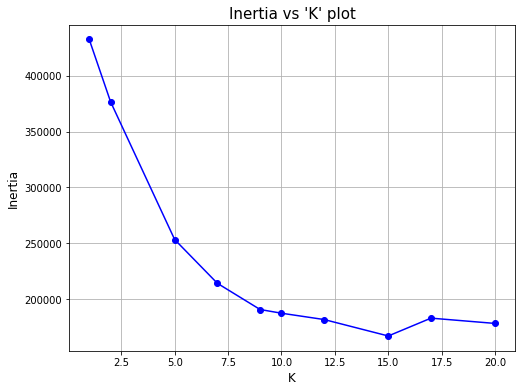

In [0]:
plt.figure(figsize = (8,6))
plt.plot(K, inertia, 'bo-')
plt.title("Inertia vs 'K' plot", fontsize = 15)
plt.xlabel('K', fontsize = 12)
plt.ylabel('Inertia', fontsize = 12)
plt.grid(1)
plt.show()

* From above plot we can say __K=15__ is knee-point.

In [0]:
k_means = MiniBatchKMeans(n_clusters = 15, batch_size = 100, random_state = 0, compute_labels = True)
k_means.fit(X)

# to save the model
save_model(k_means, name = 'K_Mean')

# # load saved model
# import pickle
# f = open('/content/drive/My Drive/Colab Notebooks/Assignments/Clustering/K_Mean.pkl', 'rb')
# k_means = pickle.load(f)
# f.close()

In [63]:
# to count the number of items in numpy array: https://stackoverflow.com/a/28663910
labels_kmeans = k_means.labels_
label_count_dict = dict(Counter(labels_kmeans)) #it's not sorted, let's sort it
label_count_dict_sorted1 = dict(sorted(label_count_dict.items()))
print('{} clusters with labels {}\nPoints per cluster: {}'
      .format(len(np.unique(labels_kmeans)),np.unique(labels_kmeans),label_count_dict_sorted1))

15 clusters with labels [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]
Points per cluster: {0: 8470, 1: 276, 2: 11748, 3: 593, 4: 5595, 5: 7865, 6: 5892, 7: 323, 8: 20767, 9: 1368, 10: 1159, 11: 2023, 12: 25835, 13: 4696, 14: 12635}




For Cluster label  0
Number of class '0' and class '1' in cluseter '0':  {0: 2131, 1: 6339}
Totla number of essays that are merged:  8470
Unique number of words in merged essays are:  21304 



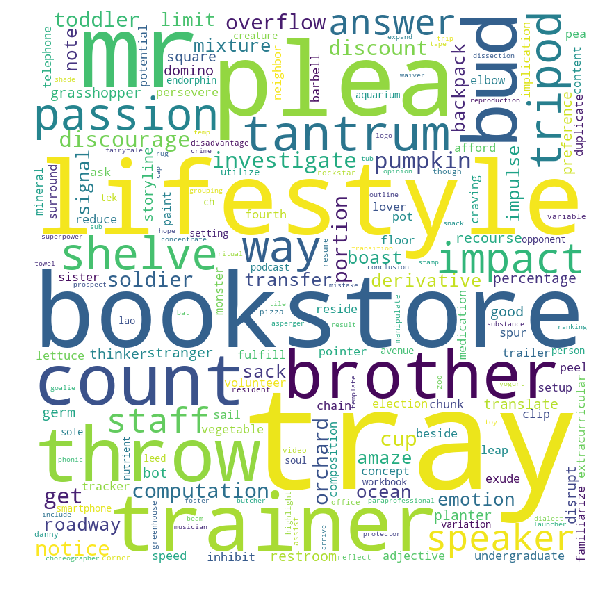



For Cluster label  1
Number of class '0' and class '1' in cluseter '0':  {1: 270, 0: 6}
Totla number of essays that are merged:  276
Unique number of words in merged essays are:  4097 



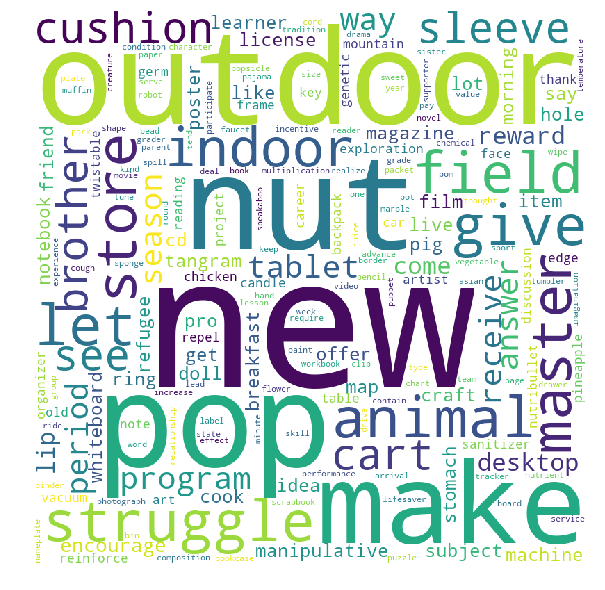



For Cluster label  2
Number of class '0' and class '1' in cluseter '0':  {1: 10215, 0: 1533}
Totla number of essays that are merged:  11748
Unique number of words in merged essays are:  24769 



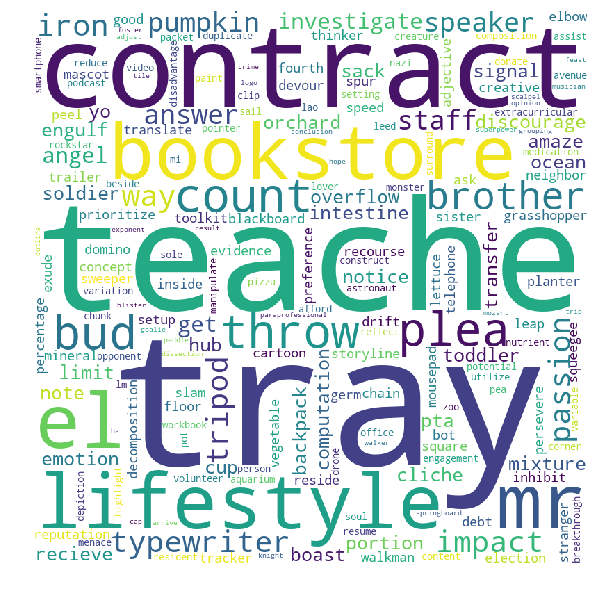



For Cluster label  3
Number of class '0' and class '1' in cluseter '0':  {0: 193, 1: 400}
Totla number of essays that are merged:  593
Unique number of words in merged essays are:  7676 



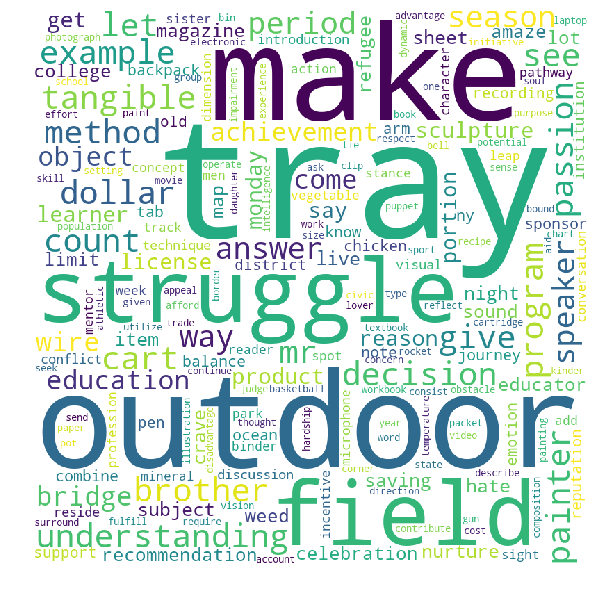



For Cluster label  4
Number of class '0' and class '1' in cluseter '0':  {1: 4294, 0: 1301}
Totla number of essays that are merged:  5595
Unique number of words in merged essays are:  18268 



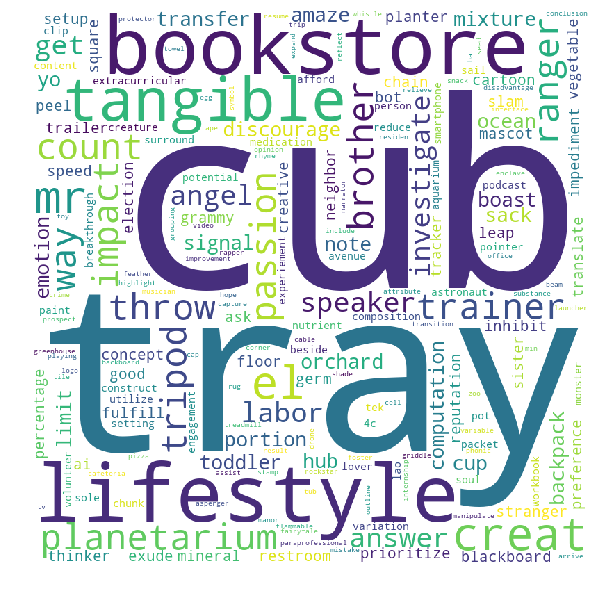



For Cluster label  5
Number of class '0' and class '1' in cluseter '0':  {1: 7044, 0: 821}
Totla number of essays that are merged:  7865
Unique number of words in merged essays are:  17855 



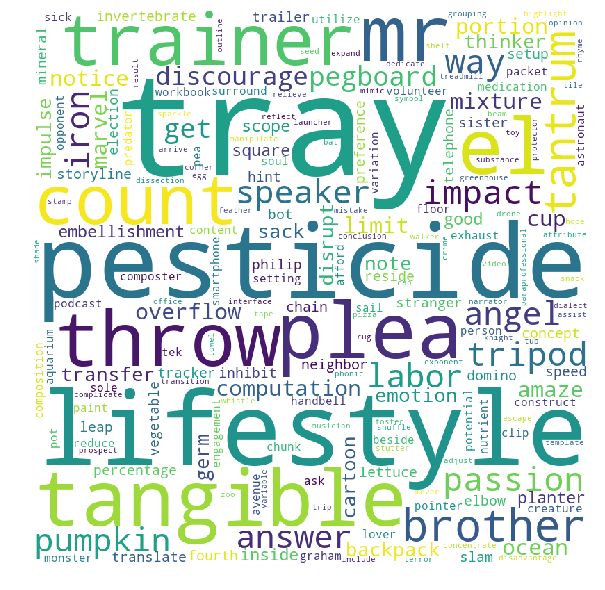



For Cluster label  6
Number of class '0' and class '1' in cluseter '0':  {1: 4890, 0: 1002}
Totla number of essays that are merged:  5892
Unique number of words in merged essays are:  19245 



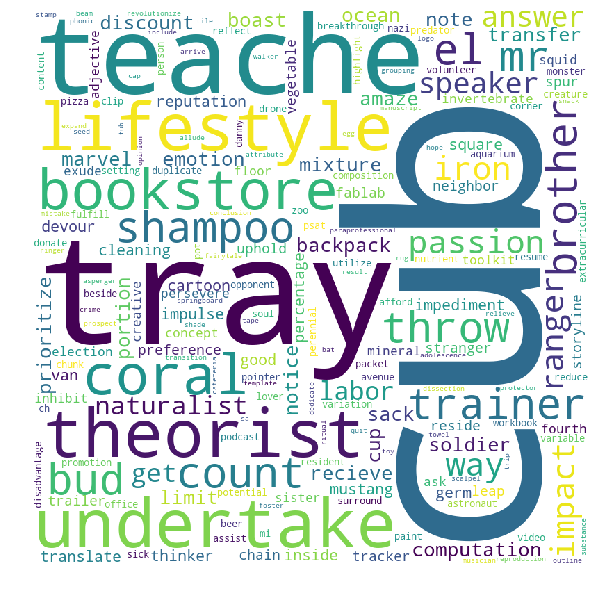



For Cluster label  7
Number of class '0' and class '1' in cluseter '0':  {1: 254, 0: 69}
Totla number of essays that are merged:  323
Unique number of words in merged essays are:  5462 



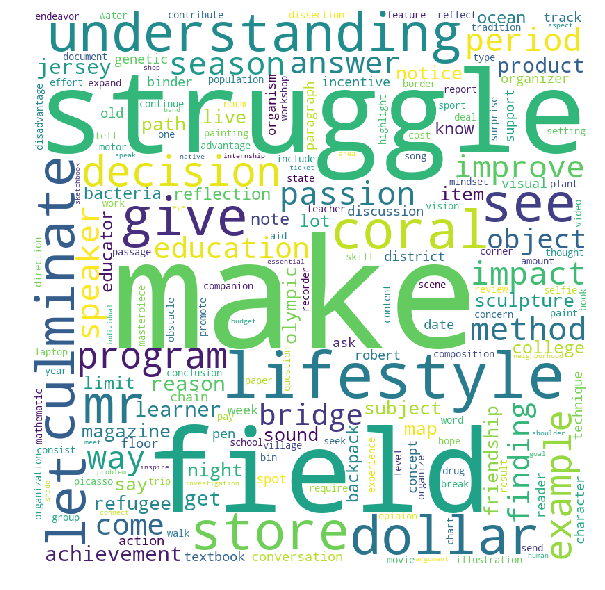



For Cluster label  8
Number of class '0' and class '1' in cluseter '0':  {1: 17736, 0: 3031}
Totla number of essays that are merged:  20767
Unique number of words in merged essays are:  27427 



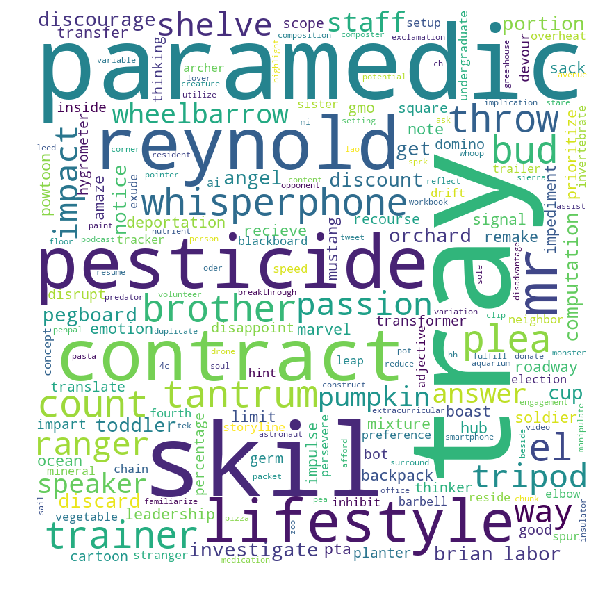



For Cluster label  9
Number of class '0' and class '1' in cluseter '0':  {1: 1107, 0: 261}
Totla number of essays that are merged:  1368
Unique number of words in merged essays are:  11091 



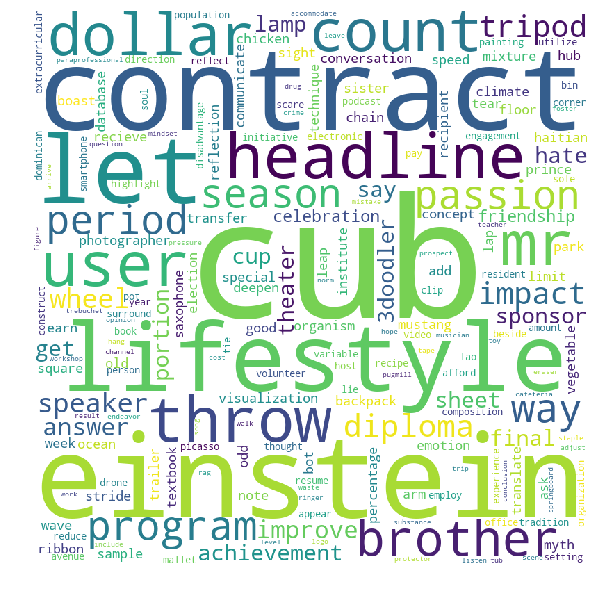



For Cluster label  10
Number of class '0' and class '1' in cluseter '0':  {1: 953, 0: 206}
Totla number of essays that are merged:  1159
Unique number of words in merged essays are:  9752 



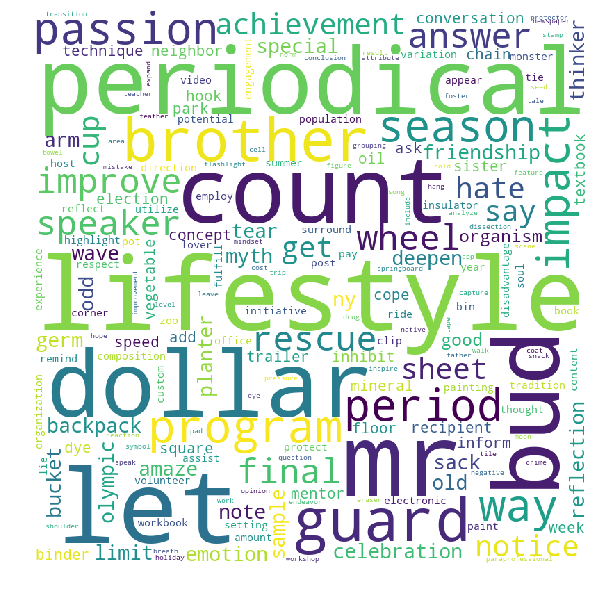



For Cluster label  11
Number of class '0' and class '1' in cluseter '0':  {1: 1883, 0: 140}
Totla number of essays that are merged:  2023
Unique number of words in merged essays are:  11259 



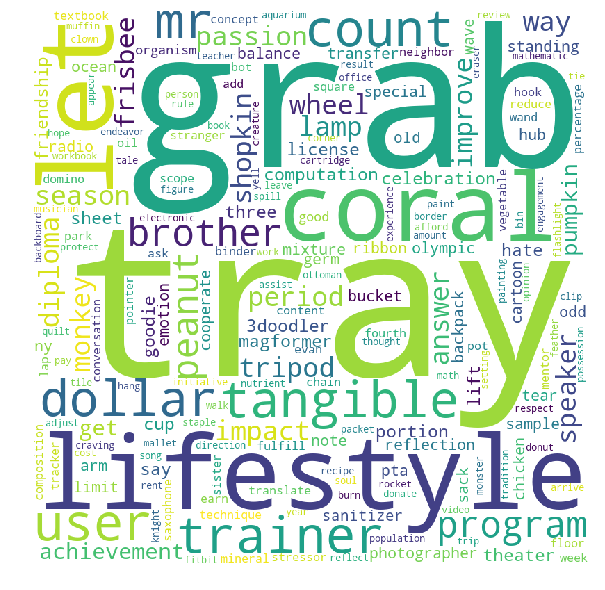



For Cluster label  12
Number of class '0' and class '1' in cluseter '0':  {1: 22601, 0: 3234}
Totla number of essays that are merged:  25835
Unique number of words in merged essays are:  30305 



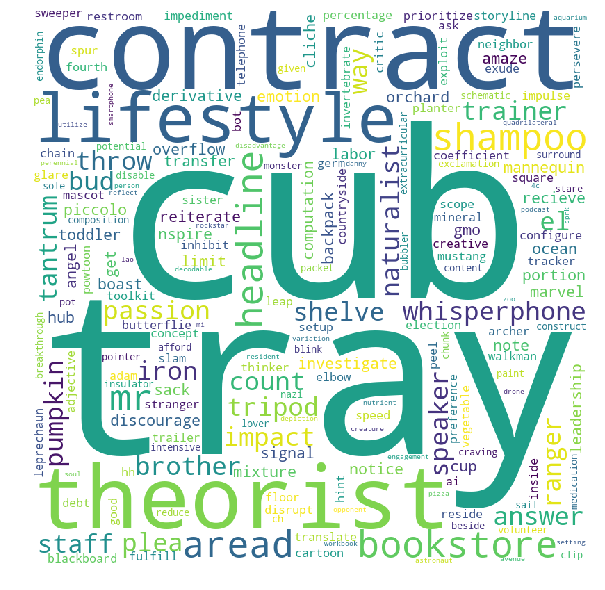



For Cluster label  13
Number of class '0' and class '1' in cluseter '0':  {1: 4298, 0: 398}
Totla number of essays that are merged:  4696
Unique number of words in merged essays are:  15243 



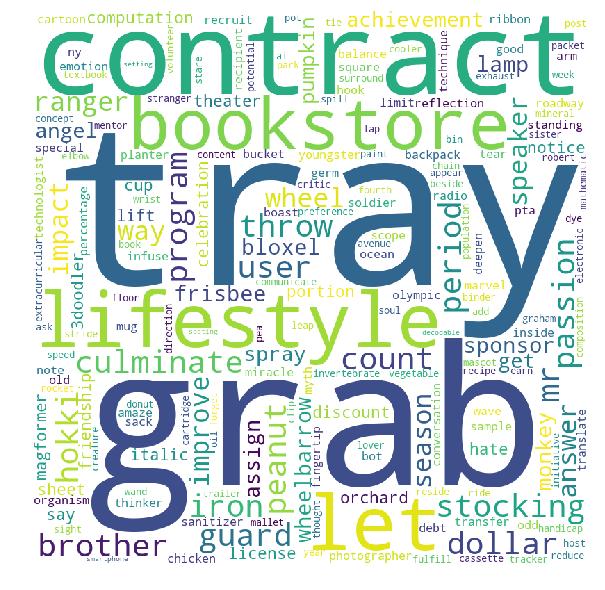



For Cluster label  14
Number of class '0' and class '1' in cluseter '0':  {1: 10419, 0: 2216}
Totla number of essays that are merged:  12635
Unique number of words in merged essays are:  23437 



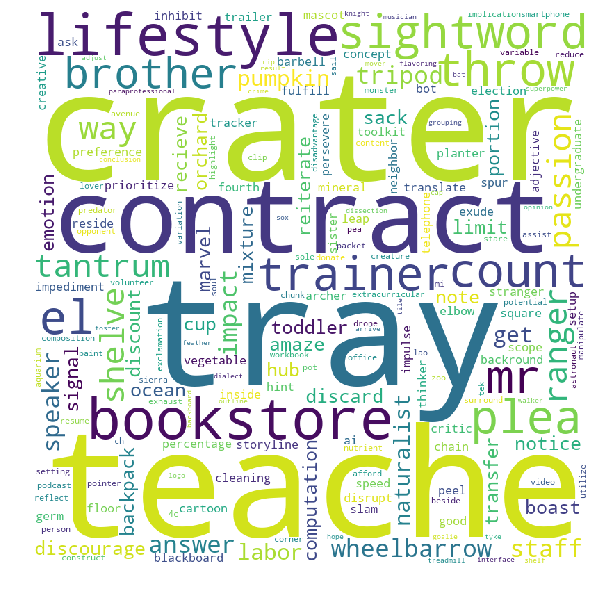

In [0]:
for i in np.unique(labels_kmeans):
  mask = labels_kmeans == i
  
  print('\n\nFor Cluster label ', i)
  # selecting those Y_i's (project_is apporoved) which belongs to "cluster '0'"
  aa = Y.iloc[mask].values.ravel()
  # to count all unique elements in numpy array: https://stackoverflow.com/a/28663910
  print("Number of class '0' and class '1' in cluseter '0': ", dict(Counter(aa))) 

  data = project_data[['essay']][mask]
  # all essay's in one list
  essays = []
  for i in range(data.shape[0]):
    essays.append(data['essay'].iloc[i].split())
    
  print("Totla number of essays that are merged: ",len(essays))

  # to remove the duplecaets from essays, list (but this is unhashable i.e.list in list or tupe in list)
  # https://stackoverflow.com/a/38387426
  new_essays = set()
  for i in essays:
    i = set(i)
    new_essays = new_essays|i # taking the unions

  # chanign set to numpy array:
  new_essays = np.array(list(new_essays))
  print('Unique number of words in merged essays are: ',len(new_essays), '\n')
  word_cloud(new_essays)

### 2.6 Apply AgglomerativeClustering

* Taking only __10k__ datapoints

In [0]:
# https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html
from sklearn.cluster import AgglomerativeClustering
new_x = X[0:10000,:].toarray()

#clusters = 2
hier_agglomerative_n2 = AgglomerativeClustering(n_clusters = 2, affinity = 'euclidean')
hier_agglomerative_n2.fit(new_x)
save_model(hier_agglomerative_n2, name = 'hier_agglomerative_n2')

#clusters = 5
hier_agglomerative_n5 = AgglomerativeClustering(n_clusters = 5, affinity = 'euclidean')
hier_agglomerative_n5.fit(new_x)
save_model(hier_agglomerative_n5, name = 'hier_agglomerative_n5')

# # to read the trained models of agglomerative clustering
# f = open('/content/drive/My Drive/Colab Notebooks/Assignments/Clustering/hier_agglomerative_n2.pkl', 'rb')
# hier_agglomerative_n2 = pickle.load(f)
# f.close()

# f = open('/content/drive/My Drive/Colab Notebooks/Assignments/Clustering/hier_agglomerative_n5.pkl', 'rb')
# hier_agglomerative_n5 = pickle.load(f)
# f.close()

* __#clusters = 2__

In [62]:
# to count the number of items in numpy array: https://stackoverflow.com/a/28663910
labels_aggl_2 = hier_agglomerative_n2.labels_
label_count_dict = dict(Counter(labels_aggl_2)) #it's not sorted, let's sort it
label_count_dict_sorted2 = dict(sorted(label_count_dict.items()))
print('{} clusters with labels {}\nPoints per cluster: {}'
      .format(len(np.unique(labels_aggl_2)),np.unique(labels_aggl_2),label_count_dict_sorted2))

2 clusters with labels [0 1]
Points per cluster: {0: 9678, 1: 322}




For Cluster label  0
Number of class '0' and class '1' in cluseter '0':  {1: 8354, 0: 1324}
After merging all number of essay's:  9678
Unique number of words in essay are: 22229


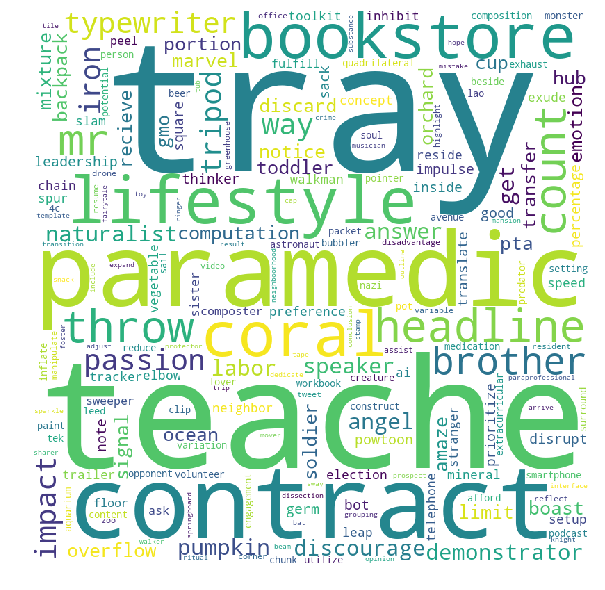



For Cluster label  1
Number of class '0' and class '1' in cluseter '0':  {1: 266, 0: 56}
After merging all number of essay's:  322
Unique number of words in essay are: 5477


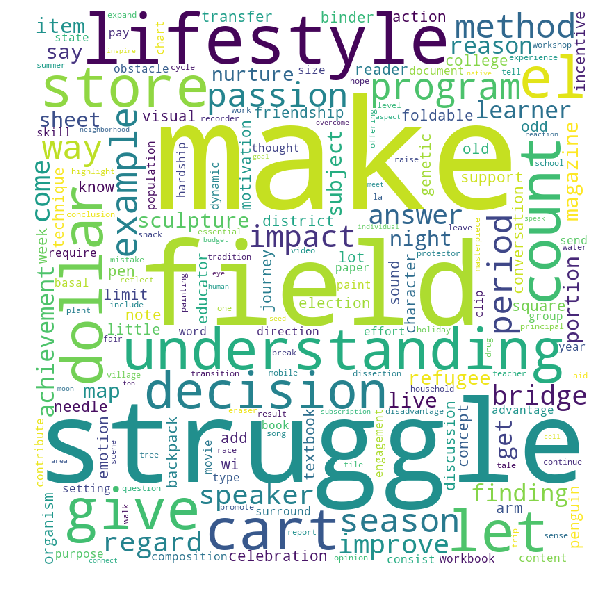

In [0]:
for i in np.unique(labels_aggl_2):
  mask = labels_aggl_2 == i  
  print('\n\nFor Cluster label ', i)
  
  aa = Y.iloc[0:10000][mask].values.ravel()
  # to count all unique elements in numpy array: https://stackoverflow.com/a/28663910
  print("Number of class '0' and class '1' in cluseter '0': ", dict(Counter(aa))) 

  data = project_data[['essay']].iloc[0:10000][mask]
  # all essay's in one list
  essays = []
  for i in range(data.shape[0]):
    essays.append(data['essay'].iloc[i].split())
    
  print("After merging all number of essay's: ",len(essays))

  # to remove the duplecaets from essays, list (but this is unhashable i.e.list in list or tupe in list)
  # https://stackoverflow.com/a/38387426
  new_essays = set()
  for i in essays:
    i = set(i)
    new_essays = new_essays|i # taking the unions

  # chanign set to numpy array:
  new_essays = np.array(list(new_essays))
  print('Unique number of words in essay are:',len(new_essays))
  word_cloud(new_essays)

* __#clusters = 5__

In [61]:
# to count the number of items in numpy array: https://stackoverflow.com/a/28663910
labels_aggl_5 = hier_agglomerative_n5.labels_
label_count_dict = dict(Counter(labels_aggl_5)) #it's not sorted, let's sort it
label_count_dict_sorted3 = dict(sorted(label_count_dict.items()))
print('{} clusters with labels {}\nPoints per cluster: {}'
      .format(len(np.unique(labels_aggl_5)),np.unique(labels_aggl_5),label_count_dict_sorted3))

5 clusters with labels [0 1 2 3 4]
Points per cluster: {0: 1160, 1: 322, 2: 300, 3: 6140, 4: 2078}




For Cluster label  0
Number of class '0' and class '1' in cluseter '0':  {1: 926, 0: 234}
After merging all number of essay's:  1160
Unique number of words in essay are: 9835


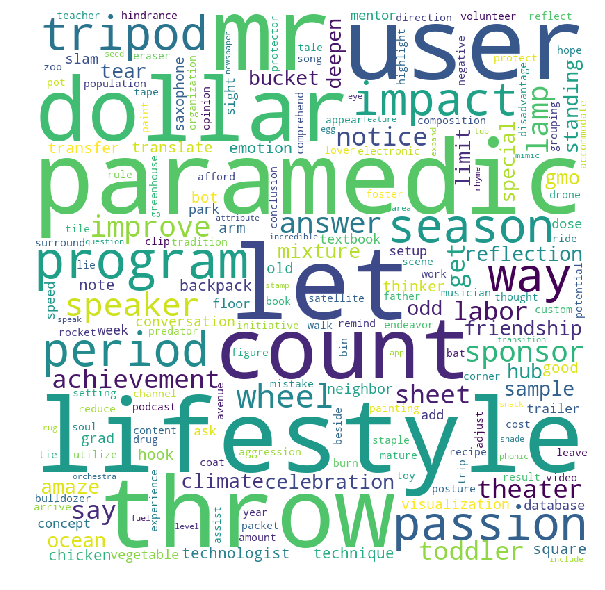



For Cluster label  1
Number of class '0' and class '1' in cluseter '0':  {1: 266, 0: 56}
After merging all number of essay's:  322
Unique number of words in essay are: 5477


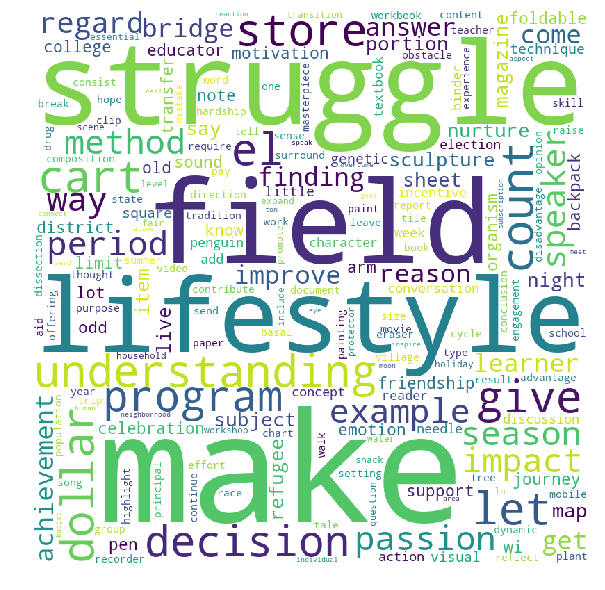



For Cluster label  2
Number of class '0' and class '1' in cluseter '0':  {1: 273, 0: 27}
After merging all number of essay's:  300
Unique number of words in essay are: 5340


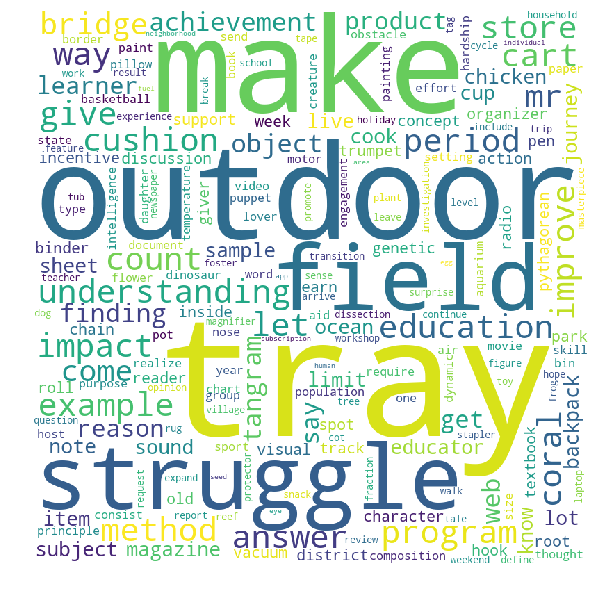



For Cluster label  3
Number of class '0' and class '1' in cluseter '0':  {1: 5368, 0: 772}
After merging all number of essay's:  6140
Unique number of words in essay are: 17977


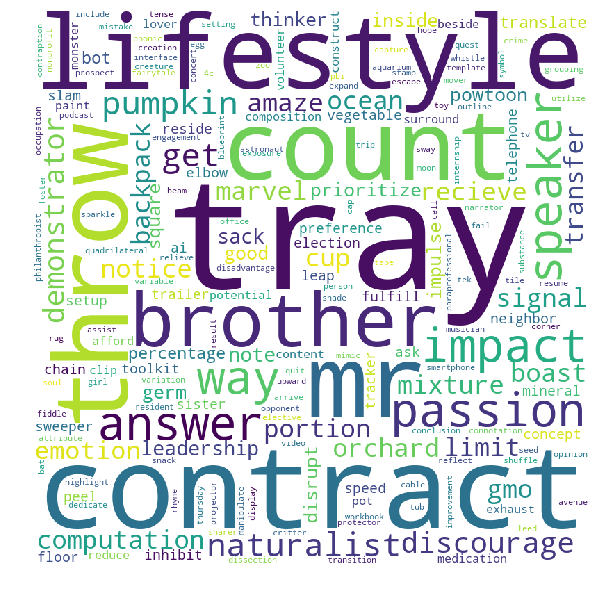



For Cluster label  4
Number of class '0' and class '1' in cluseter '0':  {1: 1787, 0: 291}
After merging all number of essay's:  2078
Unique number of words in essay are: 12434


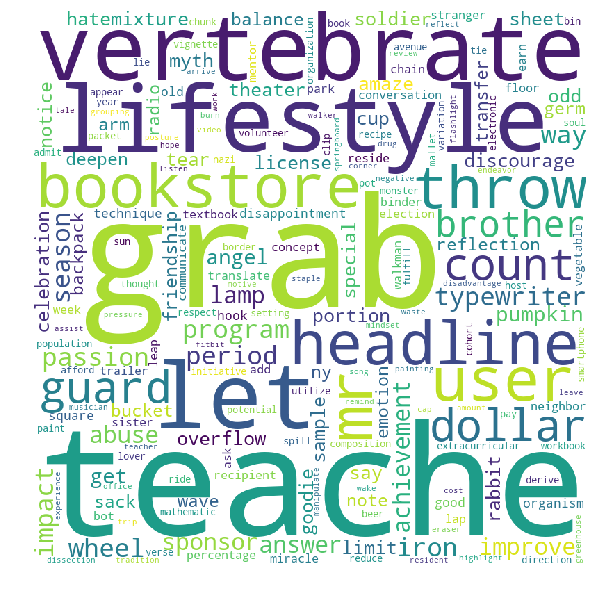

In [0]:
for i in np.unique(labels_aggl_5):
  mask = labels_aggl_5 == i  
  print('\n\nFor Cluster label ', i)
  
  aa = Y.iloc[0:10000][mask].values.ravel()
  # to count all unique elements in numpy array: https://stackoverflow.com/a/28663910
  print("Number of class '0' and class '1' in cluseter '0': ", dict(Counter(aa))) 

  data = project_data[['essay']].iloc[0:10000][mask]
  # all essay's in one list
  essays = []
  for i in range(data.shape[0]):
    essays.append(data['essay'].iloc[i].split())
    
  print("After merging all number of essay's: ",len(essays))

  # to remove the duplecaets from essays, list (but this is unhashable i.e.list in list or tupe in list)
  # https://stackoverflow.com/a/38387426
  new_essays = set()
  for i in essays:
    i = set(i)
    new_essays = new_essays|i # taking the unions

  # chanign set to numpy array:
  new_essays = np.array(list(new_essays))
  print('Unique number of words in essay are:',len(new_essays))
  word_cloud(new_essays)

### 2.7 Apply DBSCAN

* Taking __MinPts = 100__

In [0]:
from sklearn.cluster import DBSCAN

to find the distance from nearest neighbours: 
https://scikit-learn.org/stable/modules/neighbors.html#finding-the-nearest-neighbors
from sklearn.neighbors import NearestNeighbors
min_pts = 100
nbrs = NearestNeighbors(n_neighbors= min_pts, algorithm = 'ball_tree').fit(new_x)
distances, indices = nbrs.kneighbors(new_x)
dis = distances[:,-1]

# # to save the distances
# f = open('/content/drive/My Drive/Colab Notebooks/Assignments/Clustering/MinPts_distance.csv', 'w')
# f.write('index,Distance_d_i')
# for index, distance in enumerate(dis):
#   f.write('\n%s,%s' %(index, distance))
# f.close()  

# # loading saved distances values using panda.read_.csv
# dis = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Assignments/Clustering/MinPts_distance.csv')
# dis = dis['Distance_d_i'].values

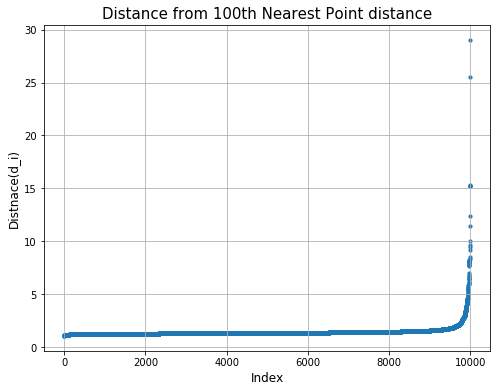

In [0]:
dis.sort()
plt.figure(figsize = (8,6))
plt.scatter(range(len(dis)), dis, s = 10)
plt.title('Distance from 100th Nearest Point distance', fontsize = 15)
plt.ylabel('Distnace(d_i)', fontsize = 12)
plt.xlabel('Index', fontsize = 12)
plt.grid(1)
plt.show()

* Taking 'eps' value as 2.5 beacuse at d_i = 2.5 (approx.) look like elbow point.

In [0]:
# https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html
dbscan = DBSCAN(eps= 2.5, min_samples= 100)
dbscan.fit(new_x)
save_model(dbscan, name = 'DBSCAN_eps_2.5') # to save the model

# # load the trained model
# f = open('/content/drive/My Drive/Colab Notebooks/Assignments/Clustering/DBSCAN_eps_2.5.pkl', 'rb')
# dbscan = pickle.load(f)
# f.close()

In [60]:
# to count the number of items in numpy array: https://stackoverflow.com/a/28663910
labels_dbscan  = dbscan.labels_
label_count_dict = dict(Counter(labels_dbscan )) #it's not sorted, let's sort it
label_count_dict_sorted4 = dict(sorted(label_count_dict.items()))
print('{} clusters with labels {}\nPoints per cluster: {}'
      .format(len(np.unique(labels_dbscan )),np.unique(labels_dbscan ),label_count_dict_sorted4))

2 clusters with labels [-1  0]
Points per cluster: {-1: 94, 0: 9906}




For Cluster label  -1
Number of class '0' and class '1' in cluseter '0':  {1: 82, 0: 12}
After merging all number of essay's:  94
Unique number of words in essay are: 3148


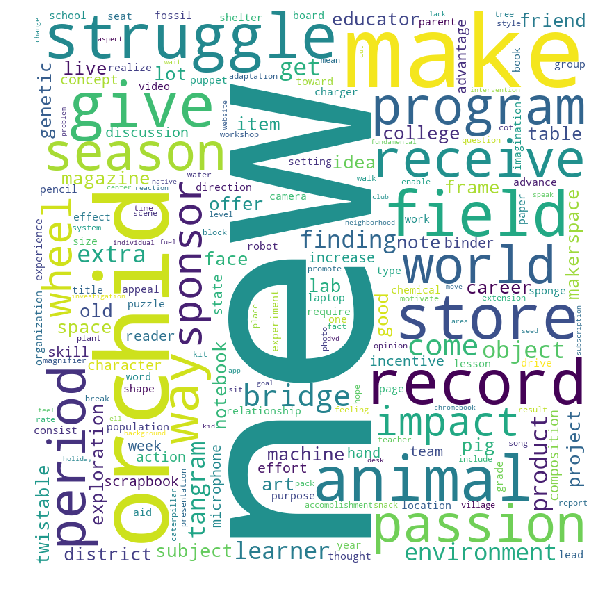



For Cluster label  0
Number of class '0' and class '1' in cluseter '0':  {1: 8538, 0: 1368}
After merging all number of essay's:  9906
Unique number of words in essay are: 22443


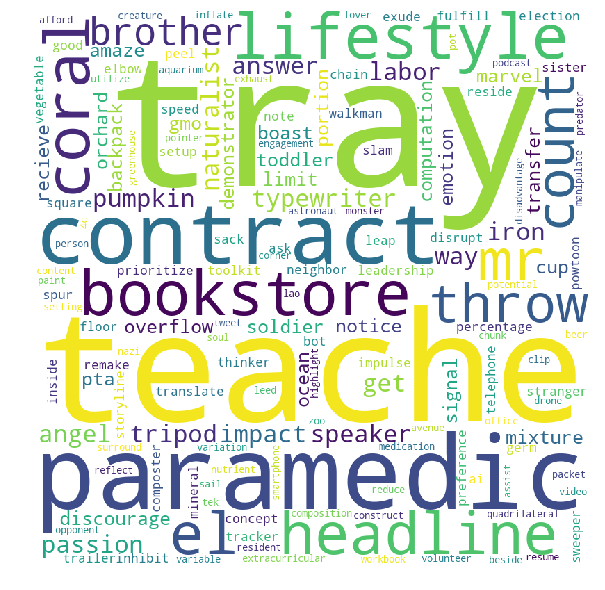

In [0]:
for i in np.unique(labels_dbscan ):
  mask = labels_dbscan  == i  
  print('\n\nFor Cluster label ', i)
  
  aa = Y.iloc[0:10000][mask].values.ravel()
  # to count all unique elements in numpy array: https://stackoverflow.com/a/28663910
  print("Number of class '0' and class '1' in cluseter '0': ", dict(Counter(aa))) 

  data = project_data[['essay']].iloc[0:10000][mask]
  # all essay's in one list
  essays = []
  for i in range(data.shape[0]):
    essays.append(data['essay'].iloc[i].split())
    
  print("After merging all number of essay's: ",len(essays))

  # to remove the duplecaets from essays, list (but this is unhashable i.e.list in list or tupe in list)
  # https://stackoverflow.com/a/38387426
  new_essays = set()
  for i in essays:
    i = set(i)
    new_essays = new_essays|i # taking the unions

  # chanign set to numpy array:
  new_essays = np.array(list(new_essays))
  print('Unique number of words in essay are:',len(new_essays))
  word_cloud(new_essays)

## 3. Cocnlusions

In [67]:
# Please compare all your models using Prettytable library
from prettytable import PrettyTable
#If you get a ModuleNotFoundError error , install prettytable using: pip3 install prettytable
x = PrettyTable()
x.field_names = ["Clustering Model", " Total #clusters", "Class '0' to cluster label", "Class '1' to cluster label"]

x.add_row(['K-Means', len(np.unique(labels_kmeans)), '3,4,7', 'Other clusters'])
x.add_row(['Hierarchical (Aggl.)', len(np.unique(labels_aggl_2)), '1', '0'])
x.add_row(['Hierarchical (Aggl.)', len(np.unique(labels_aggl_5)), 1, 'Other than Cluster label 1'])
x.add_row(['DBSCAN', len(np.unique(labels_dbscan )),-1, 0])

print(x)

+----------------------+------------------+----------------------------+----------------------------+
|   Clustering Model   |  Total #clusters | Class '0' to cluster label | Class '1' to cluster label |
+----------------------+------------------+----------------------------+----------------------------+
|       K-Means        |        15        |           3,4,7            |       Other clusters       |
| Hierarchical (Aggl.) |        2         |             1              |             0              |
| Hierarchical (Aggl.) |        5         |             1              | Other than Cluster label 1 |
|        DBSCAN        |        2         |             -1             |             0              |
+----------------------+------------------+----------------------------+----------------------------+


__<font size = 4>Summary</font>__

__K-Means__
* From plot of inertia vs K: best K = 15.
* Cluster label '3' '4' and '7' has compartively higher proportion of rejected projects (i.e. class '0') than other clusters, so I'm assigning this cluster as negative cluster and rest other cluster label as accepted project (i.e. class '1').

__Agglomearive Clustering__
* Tried with __#clusters = 2 and 5__.
* For #clusters = 2:
 * Cluster label '1' as rejected project and cluster label '0' as accepted project becasue of proportion of both classes present in each cluster.
*  For #clusters = 5:
 * Cluster label '1' as rejected project and rest other clusters as accepted projects

__DBSCAN__
* I've taken __MinPts = 100__.
* From plot distance (d_i) vs index plot:__d_i = 2.5__ as __Knee-point__. So __eps = 2.5__.
* This resulted into two clusters. 
* Cluster label '-1' can be assigned to rejected projects and cluster label '0' to accepted projects.

__<font size = 4>Conclusion</font>__

K-Means is using whole data and other two are using only 10k data points.